In [3]:
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.layers as layers
import numpy as np
import datetime

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# 使用MobileNet v1模型，并基于该模型完成 Fine Tune 的过程。
# Fine Tune 即在已训练模型的基础上替换最后几层再重新训练。
# MobileNet是作者已经训练好的，但不管怎么训练，它的特征提取部分是可以重用的，
# 把MobileNet的特征提取的部分拿来作为静态层，再在后面接上自己的分类层作为新的模型，训练的时候只训练后面的分类层。
# 这样可以降低训练的压力，这就是Fine Tune的其中一个思路。

# 导入MobieNet模型
mobilenet = tf.keras.applications.MobileNet(weights='imagenet',input_shape=(224,224,3))


17227776/17225924 [==============================] - 0s 0us/step


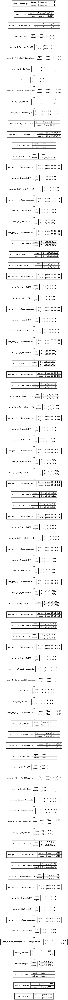

In [6]:
# 查看keras里的模式。show_shapes为是否输出模型
keras.utils.plot_model(mobilenet, show_shapes=True)

In [7]:
# MoblieNet大致能分为两个部分，特征激活和特征分类。
# 。在常见的卷积神经网络中，全连接层之前的卷积层负责对图像进行特征提取，
# 在获取特征后，传统的方法是接上 GAP 或全连接层之后再进行激活分类。
# 因此只需要重训练最后的激活分类层即可。

In [8]:
# 从上面的模型结构中我们可以发现，conv_pw_13_relu 层为特征激活层，
# 因为其后为GAP层（global_average_polling2d）。
x = mobilenet.get_layer('conv_pw_13_relu').output

In [9]:
# 使用layers.Flatten定义在特征提取后跟上展平层对象。
x = layers.Flatten()(x)
# 使用layers.Dense 接上全连接层和分类层。通常在使用Dense Layer时，
# 在最后一次分类前会使用relu作为激活函数，
# 选择softmax作为激活函数。
x = layers.Dense(100, activation='relu')(x)
predictLayer = layers.Dense(2, activation='softmax')(x)

In [10]:
# 得到了模型的输入和输出了，使用 keras.Model 对象创建完整的模型。
# 该对象在实例化时需要传入 2 个参数，分别是以数组形式表示的模型输入层变量 inputs 和以数组形式表示的模型输出层变量 outputs。
newModel = keras.Model(inputs=mobilenet.input, outputs=predictLayer)

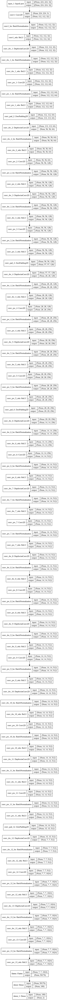

In [11]:
keras.utils.plot_model(newModel, show_shapes=True)

In [12]:
# 在新模型中我们实际上只需要训练最后新增的几层，并且 Flatten 层本身不需要训练。
# 遍历使用 newModel.layers 遍历模型中所有层并将 trainable 属性设置为 False。
for layer in newModel.layers:
    layer.trainable = False

In [13]:
# 将模型的最后两层的 trainable 设置为 False。
newModel.layers[-2].trainable = True
newModel.layers[-1].trainable = True

In [14]:
# 测试是否只有后面两层在训练
for layer in newModel.layers:
    print(layer.trainable)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
True


In [15]:
# 使用Adam作为优化器，设置学习速率
adam = keras.optimizers.Adam(0.0001)

In [16]:
# 编译模型，该函数需要传入 3 个参数，分别是损失函数 loss，优化器 optimizer 和评估函数 metrics。
# 选择交叉熵损失函数作为损失函数，使用交叉熵准确率作为评估方式。
newModel.compile(loss='categorical_crossentropy',
              optimizer=adam,
              metrics=['categorical_accuracy'])

In [17]:
# 测试模型是否编译完,summary输出模型的结构
newModel.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)      0     

In [18]:
# 使用 Tensorboard 作为模型训练监视器,，该函数需要传入 3 个值，
# 分别是中间结果存储路径 path，是否可视化图像 write_graph，
# 和是否计算模型层的激活和权重直方图 histogram_freq。
tensorBoard = keras.callbacks.TensorBoard(log_dir='kerasLog', write_images=1, histogram_freq=1)

In [19]:
# 导入处理好的数据
trainData = np.load('/content/drive/MyDrive/Cat_vs_Dog/trainDataNormalized.npy')
trainLabel = np.load('/content/drive/MyDrive/Cat_vs_Dog/trainLabelOneHot.npy')

In [20]:
# 使用fit函数进行训练,该函数需要传入 7 个值，
# 分别是模型训练集中的特征数据 x，训练集中的标签值 y，每个 batch 大小 batch_size，显存越大,batch_size可以设置越大
# 测试集占比 validation_split，训练的纪元数 epochs，回调函数 callbacks 和训练过程输出模式 verbose。
newModel.fit(trainData, trainLabel, epochs=30, batch_size=128, validation_split=0.3, callbacks=[tensorBoard], verbose=1)

Epoch 1/30
28/28 [==============================] - 187s 7s/step - loss: 0.6548 - categorical_accuracy: 0.8578 - val_loss: 0.0810 - val_categorical_accuracy: 0.9700
Epoch 2/30
28/28 [==============================] - 182s 7s/step - loss: 0.0413 - categorical_accuracy: 0.9857 - val_loss: 0.0505 - val_categorical_accuracy: 0.9787
Epoch 3/30
28/28 [==============================] - 142s 5s/step - loss: 0.0147 - categorical_accuracy: 0.9963 - val_loss: 0.0468 - val_categorical_accuracy: 0.9814
Epoch 4/30
28/28 [==============================] - 142s 5s/step - loss: 0.0049 - categorical_accuracy: 0.9997 - val_loss: 0.0455 - val_categorical_accuracy: 0.9820
Epoch 5/30
28/28 [==============================] - 143s 5s/step - loss: 0.0025 - categorical_accuracy: 1.0000 - val_loss: 0.0461 - val_categorical_accuracy: 0.9814
Epoch 6/30
28/28 [==============================] - 182s 7s/step - loss: 0.0017 - categorical_accuracy: 1.0000 - val_loss: 0.0477 - val_categorical_accuracy: 0.9814
Epoch 7/30

In [21]:
newModel.save('lastmodel.h5')

In [22]:
%load_ext tensorboard
%tensorboard --logdir '/content/kerasLog/'

Launching TensorBoard...

<IPython.core.display.Javascript object>